# DATASCI 207: Applied Machine Learning - Final Project
## <span style="color:blue"> Scott Abramson, Brett Brandom, Maria Jose Healey, Yidai Yao </span>

### <span style="color:chocolate"> Pawpularity:Predicting Engagement with a Pet's Profile Based on the Photograph for that Profile.  </span>

#### ``Introduction``

Have you ever wondered how much a captivating picture can influence your decision to adopt or facilitate the adoption of an animal? In the world of the animal welfare, where countless of stray animals are suffering on the streets or in shelters every day, the power of a single image extends beyond aesthetics – it serves as a potential lifeline.
PetFinder.my is Malaysia’s leading animal welfare platform and it collaborates closely with animal lovers, media, corporations, and global organizations to improve animal welfare. Currently it analyzes cuteness and other factors to rank animals images, which is still in an experimental stage with rooms for improvements.

#### ``Objective``

With the rise of data science, we aim to help by predicting the appealingness of an image through the "Pawpularity" project to hopefully increase the chances of finding caring homes for these rescue animals. By analyzing both raw images and the metadata, we seek to enhance PetFinder.my's existing approach and provide actionable insights to increase adoption rates. Through this endeavor, we strive to not only improve the fortunes of individual animals but also contribute to the broader cause of animal welfare worldwide.

#### ``Data``

The data was obtained from kaggle: https://www.kaggle.com/competitions/petfinder-pawpularity-score

The dataset comprises both images and tabular data (hand-labeled metadata for each photo). 
The Pawpularity Score is derived from each pet profile's page view statistics at the listing pages, using an algorithm that normalizes the traffic data across different pages, platforms (web & mobile) and various metrics.

The training Data is composed of a train folder and a csv file. The train folder contains training set photos of the form {id}.jpg, where {id} is a unique Pet Profile ID. Whereas, the train.csv contains the metadata for each photo in the training set as well as the target, the photo's Pawpularity score. The Id column gives the photo's unique Pet Profile ID corresponding the photo's file name.

Each photo in the metadata is labeled with the value of 1 (Yes) or 0 (No) for each of the following features: 

- Focus - Pet stands out against uncluttered background, not too close / far.

- Eyes - Both eyes are facing front or near-front, with at least 1 eye / pupil decently clear.

- Face - Decently clear face, facing front or near-front.

- Near - Single pet taking up significant portion of photo (roughly over 50% of photo width or height).

- Action - Pet in the middle of an action (e.g., jumping).

- Accessory - Accompanying physical or digital accessory / prop (i.e. toy, digital sticker), excluding collar and leash.

- Group - More than 1 pet in the photo.

- Collage - Digitally-retouched photo (i.e. with digital photo frame, combination of multiple photos).

- Human - Human in the photo.

- Occlusion - Specific undesirable objects blocking part of the pet (i.e. human, cage or fence). Note that not all blocking objects are considered occlusion.

- Info - Custom-added text or labels (i.e. pet name, description).

- Blur - Noticeably out of focus or noisy, especially for the pet’s eyes and face. For Blur entries, “Eyes” column is always set to 0.

### Step 1: Import libraries

In [1]:

import numpy as np
import pandas as pd
import random

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
import keras

import sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# baseline classifier
from sklearn.dummy import DummyRegressor
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

import warnings
warnings.filterwarnings("ignore", category=UserWarning) #used to supress the tf version warning. 

import os 
import cv2
import glob
    
%matplotlib inline


In [2]:
path = 'C:\\Users\\maggi\\OneDrive\\Desktop\\DataSci-207\\Final Project\\'

### Step 2: Read Data

In [72]:
# Load images' paths
train_images = os.listdir(path + 'train')
train_df = pd.read_csv(path + 'train.csv')

train_df = train_df.set_index('Id')
file_names = []
labels = []
for index in train_df.index:
    file_name = path + 'train\\' + index + '.jpg'
    label = train_df.loc[index]['Pawpularity']
    file_names.append(file_name)
    labels.append(label/1.0)

# print number of images
print("Number of images: ", len(file_names))

Number of images:  9912


In [74]:
# tabular data
train_df = train_df.reset_index()
train_df

,Id,Subject Focus,Eyes,Face,Near,Action,Accessory,Group,Collage,Human,Occlusion,Info,Blur,Pawpularity
0,0007de18844b0dbbb5e1f607da0606e0,0,1,1,1,0,0,1,0,0,0,0,0,63
1,0009c66b9439883ba2750fb825e1d7db,0,1,1,0,0,0,0,0,0,0,0,0,42
2,0013fd999caf9a3efe1352ca1b0d937e,0,1,1,1,0,0,0,0,1,1,0,0,28
3,0018df346ac9c1d8413cfcc888ca8246,0,1,1,1,0,0,0,0,0,0,0,0,15
4,001dc955e10590d3ca4673f034feeef2,0,0,0,1,0,0,1,0,0,0,0,0,72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9907,ffbfa0383c34dc513c95560d6e1fdb57,0,0,0,1,0,0,0,0,0,0,0,1,15
9908,ffcc8532d76436fc79e50eb2e5238e45,0,1,1,1,0,0,0,0,0,0,0,0,70
9909,ffdf2e8673a1da6fb80342fa3b119a20,0,1,1,1,0,0,0,0,1,1,0,0,20
9910,fff19e2ce11718548fa1c5d039a5192a,0,1,1,1,0,0,0,0,1,0,0,0,20


### Step 3: EDA

#### Images

Display images in their original shape dimensions

In [5]:
# load images
images = []
for i in range (len(file_names)):
    img= cv2.imread(file_names[i]) # loads an image from the specified file
    images.append(img)

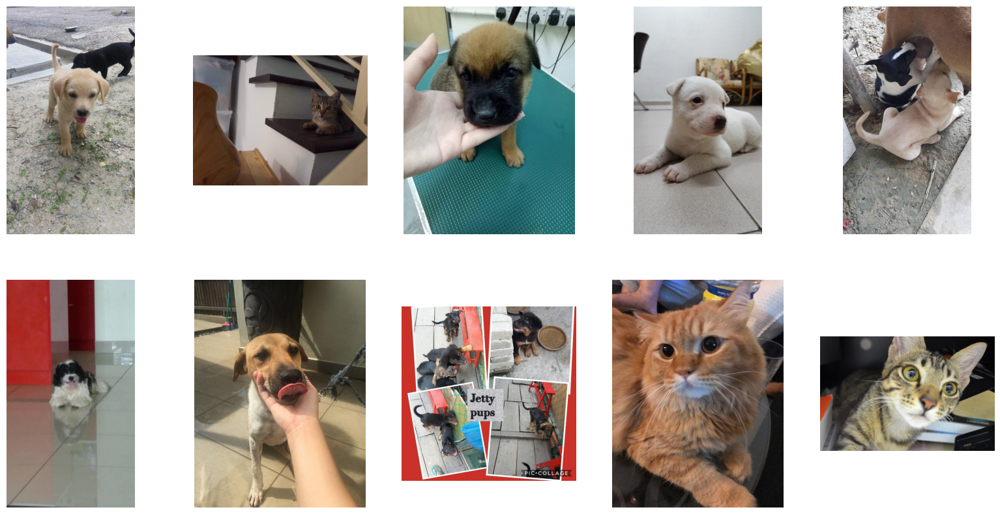

In [6]:
# Display 10 images in their original shape
index=0
num_rows=2
num_cols=5
fig, axs = plt.subplots(num_rows, num_cols, figsize=(20,10))
for i in range(num_rows):
    for j in range(num_cols):
        axs[i,j].imshow(cv2.cvtColor(images[index], cv2.COLOR_BGR2RGB)) 
        axs[i,j].axis('off')
        index+=1
plt.show()

In [7]:
# Checking first 20 images' shape dimensions
for i in range( len(images) ):
    n_shape= np.array(images[i])
    print(f"{i}" + " Image shape ", n_shape.shape)
    if i == 20:
        break

0 Image shape  (720, 405, 3)
1 Image shape  (774, 1032, 3)
2 Image shape  (960, 720, 3)
3 Image shape  (720, 405, 3)
4 Image shape  (960, 540, 3)
5 Image shape  (960, 540, 3)
6 Image shape  (960, 720, 3)
7 Image shape  (1280, 1280, 3)
8 Image shape  (960, 720, 3)
9 Image shape  (847, 1279, 3)
10 Image shape  (1280, 1280, 3)
11 Image shape  (720, 405, 3)
12 Image shape  (960, 540, 3)
13 Image shape  (960, 720, 3)
14 Image shape  (638, 581, 3)
15 Image shape  (960, 720, 3)
16 Image shape  (960, 1280, 3)
17 Image shape  (647, 648, 3)
18 Image shape  (960, 528, 3)
19 Image shape  (960, 720, 3)
20 Image shape  (569, 538, 3)


#### Identify Duplicate Images
Finding out duplicate images using imagehash (based on https://www.kaggle.com/code/schulta/petfinder-identify-duplicates-and-share-findings )

#### <span style="color:red">"DO NOT RUN" Start  </span>
The next 7 code cells require to import torch. This causes version incompatibilities with TensorFlow so, they need to run in a separate environment.

In [5]:
%load_ext autoreload
%autoreload 2

from PIL import Image
import torch # causes incompatibilities with TensorFlow
import imagehash


In [6]:
# Calculate hash values of every image in train
def hash_values():

    functions = [
        imagehash.average_hash, # average hashing
        imagehash.phash, # perceptual hashing
        imagehash.dhash, # difference hashing
        imagehash.whash, # wavelet hashing
    ]

    pet_ids = []
    hash_vals = []
    for img_path in glob.glob(path + 'train\\*.jpg'):
        image = Image.open(img_path)
        image_id = img_path.split('/')[-1].split('.')[0]
        pet_ids.append(image_id)
        hash_vals.append(np.array([func(image).hash for func in functions]).reshape(256))

    return pet_ids, np.array(hash_vals)

%time petids, hashes_all = hash_values()

CPU times: total: 2min 55s
Wall time: 5min 2s


In [7]:
# converts the numpy arrays of boolean values to tensors of int values
hashes_all = torch.Tensor(hashes_all.astype(int)).cuda()

Calculate similarity (normalized to 0-1 range) between all image pairs.

In [8]:
%time similarities = np.array([(hashes_all[i] == hashes_all).sum(dim=1).cpu().numpy()/256 for i in range(hashes_all.shape[0])])

CPU times: total: 5.19 s
Wall time: 5.65 s


Define a function to display and retrieve the pairs with in a given threshold range of similarity.

In [9]:
def show_dup_pairs(lower_threshold=0.0, upper_threshold=1.0, max=100,similarities = similarities):
    indices1 = np.where((similarities > lower_threshold) & (similarities <= upper_threshold))
    indices2 = np.where(indices1[0] != indices1[1])
    duplicates = {tuple(sorted([petids[index1], petids[index2]])): similarities[index1, index2] 
                for index1, index2 in zip(indices1[0][indices2], indices1[1][indices2])}
    print('Found %d duplicate pairs' % len(duplicates))
    
    count = 1
    for (path1, path2), similarities in duplicates.items():
        path_image1 = path1 + '.jpg'
        path_image2 = path2 + '.jpg'

        Id1 = path1.rsplit('\\', 1)[-1]
        Id2 = path2.rsplit('\\', 1)[-1]
        
        image1 = cv2.imread(path_image1)
        image2 = cv2.imread(path_image2)

        fig, axes = plt.subplots(nrows=1, ncols=2)
        fig.set_size_inches(12, 6)
        axes[0].title.set_text(Id1)
        axes[0].imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB))
        axes[1].title.set_text(Id2)
        axes[1].imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB))
        fig.suptitle(f'Similarity: {similarities}')
        plt.show()
        
        if count >= max:
            break
        
        count += 1
    
    return duplicates

Display images with similarity 0.9 - 1

Found 27 duplicate pairs


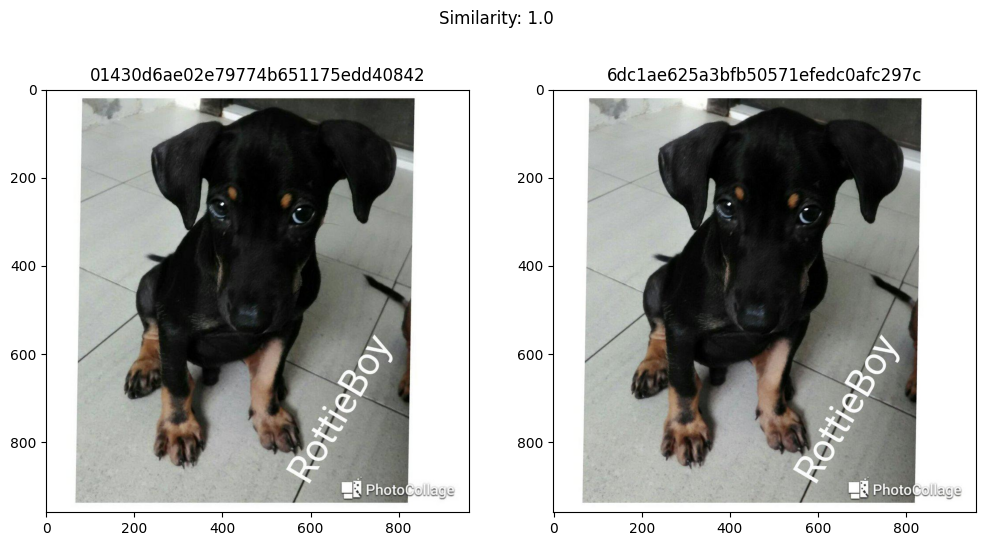

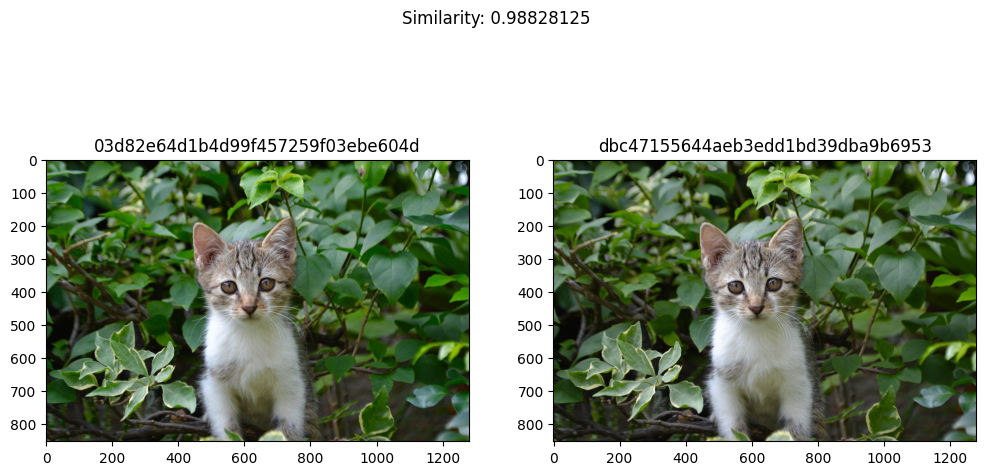

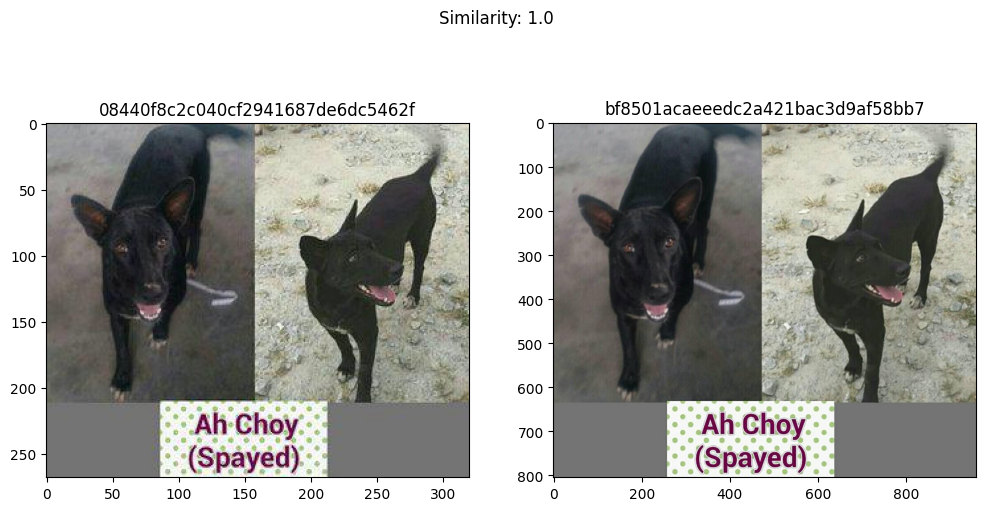

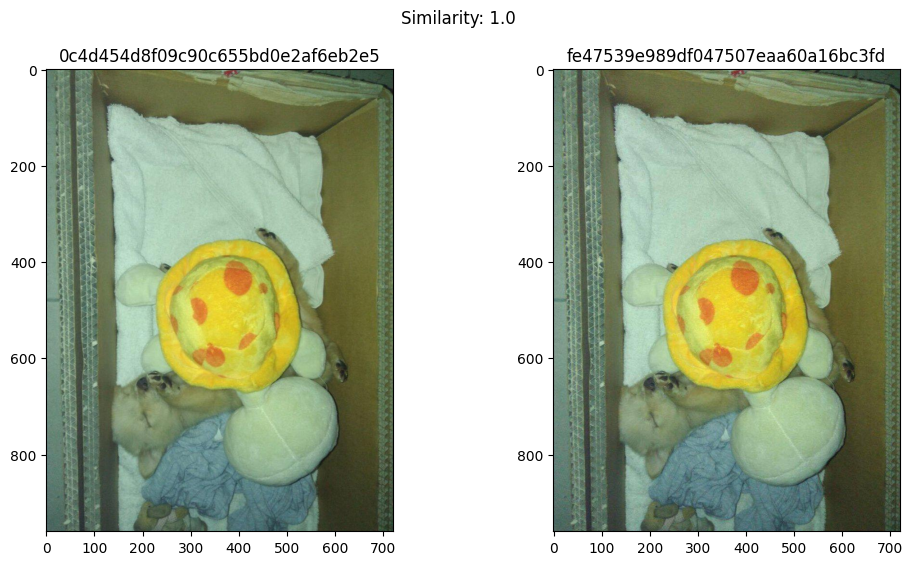

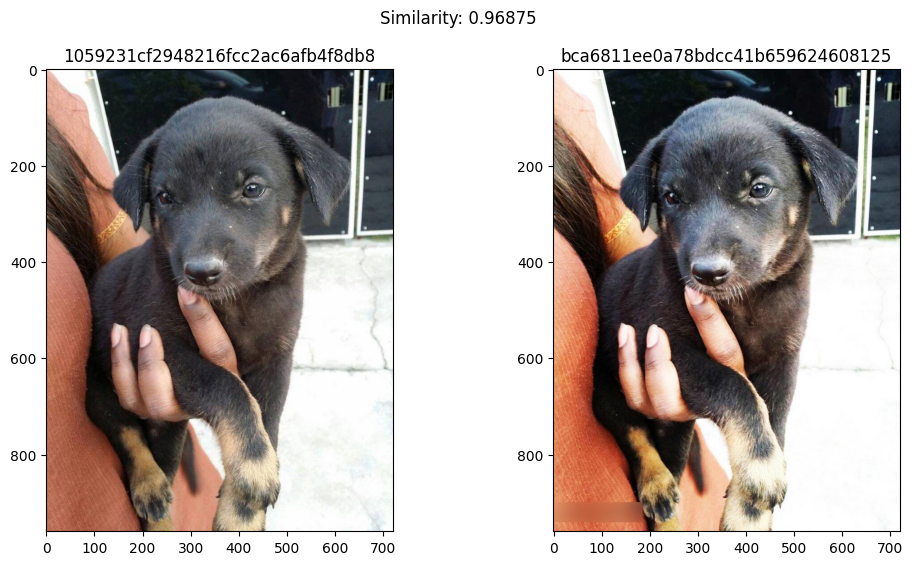

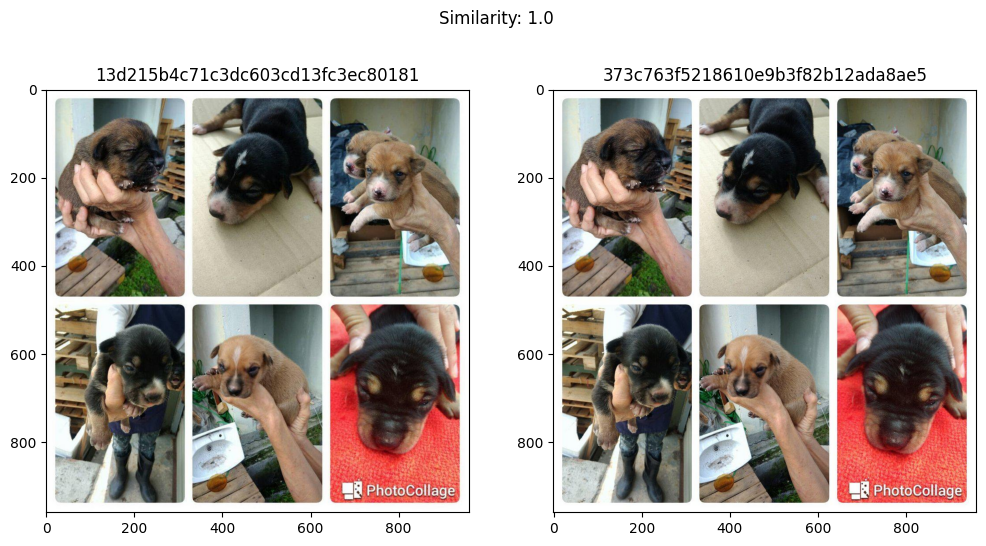

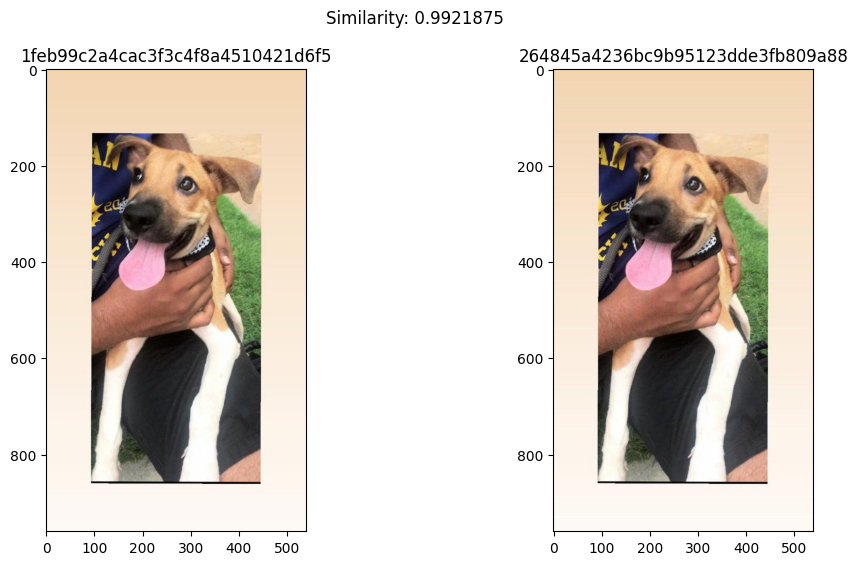

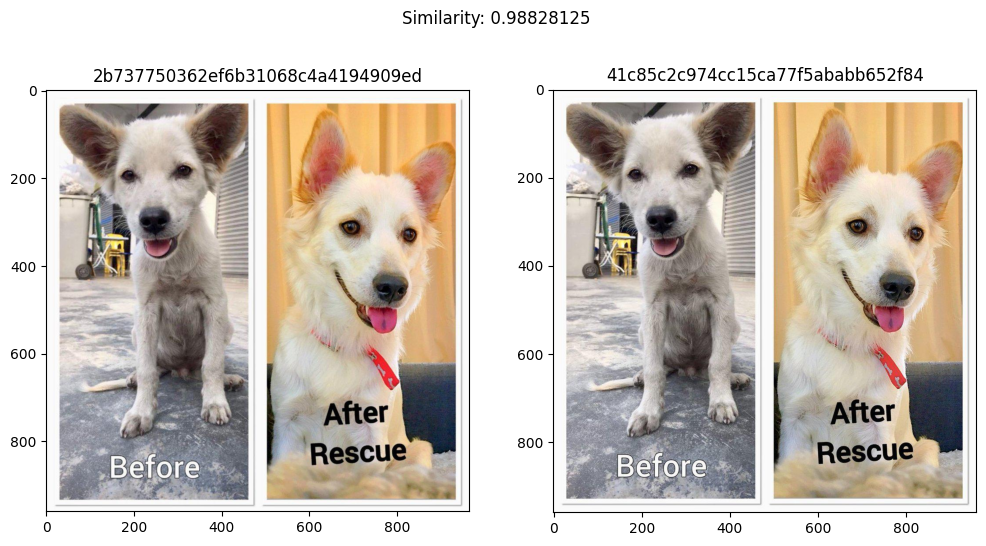

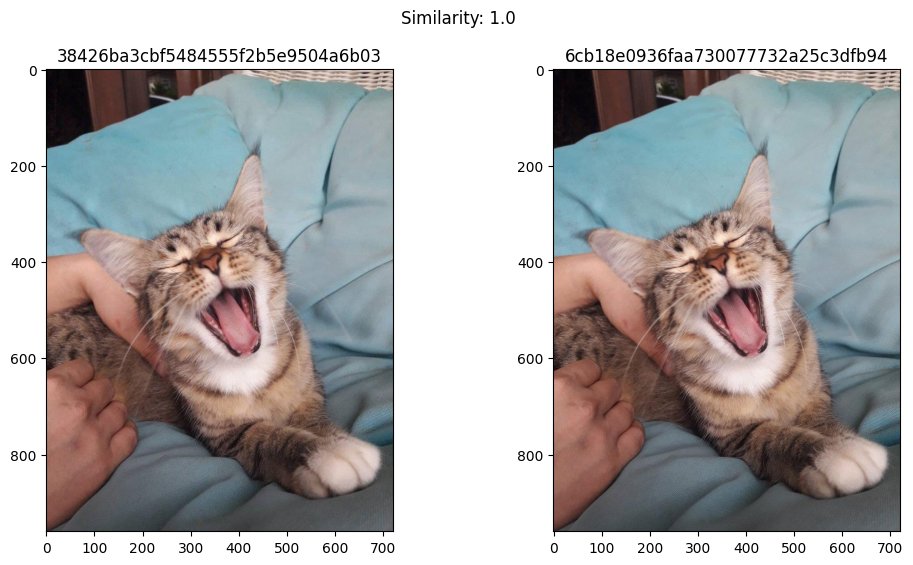

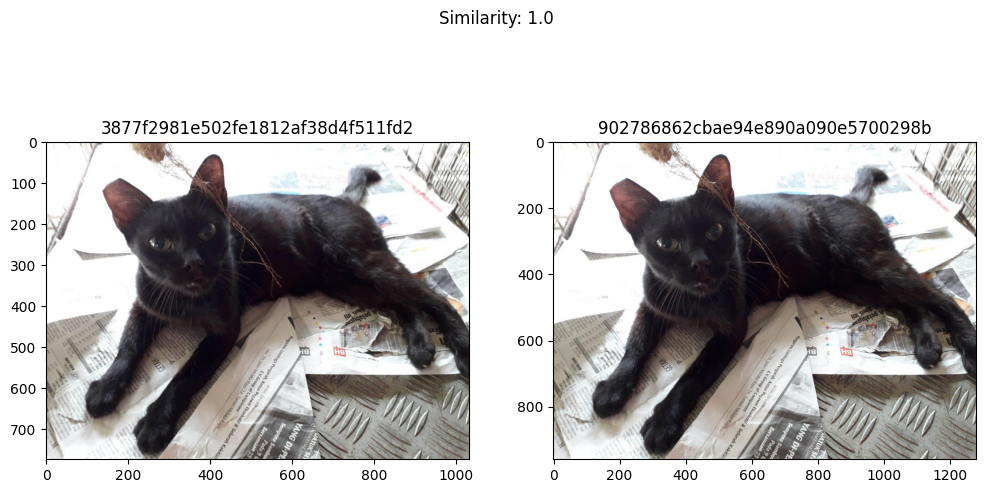

In [10]:
duplicate_images = show_dup_pairs(0.9, 1.0, 10)

In [11]:
# List of duplicate Ids 
paths_to_images2 = np.array(list(duplicate_images.keys()))[:, 1]
duplicate_ids2=[]
for i in range(len(paths_to_images2)):
    id2=paths_to_images2[i].rsplit('\\', 1)[-1] 
    duplicate_ids2.append(id2)
duplicate_ids2

['6dc1ae625a3bfb50571efedc0afc297c',
 'dbc47155644aeb3edd1bd39dba9b6953',
 'bf8501acaeeedc2a421bac3d9af58bb7',
 'fe47539e989df047507eaa60a16bc3fd',
 'bca6811ee0a78bdcc41b659624608125',
 '373c763f5218610e9b3f82b12ada8ae5',
 '264845a4236bc9b95123dde3fb809a88',
 '41c85c2c974cc15ca77f5ababb652f84',
 '6cb18e0936faa730077732a25c3dfb94',
 '902786862cbae94e890a090e5700298b',
 '9a0238499efb15551f06ad583a6fa951',
 '6ae42b731c00756ddd291fa615c822a1',
 'b956edfd0677dd6d95de6cb29a85db9c',
 'dd042410dc7f02e648162d7764b50900',
 'c504568822c53675a4f425c8e5800a36',
 '8ffde3ae7ab3726cff7ca28697687a42',
 '67e97de8ec7ddcda59a58b027263cdcc',
 '9b3267c1652691240d78b7b3d072baf3',
 '763d66b9cf01069602a968e573feb334',
 'c25384f6d93ca6b802925da84dfa453e',
 'b49ad3aac4296376d7520445a27726de',
 '988b31dd48a1bc867dbc9e14d21b05f6',
 'd050e78384bd8b20e7291b3efedf6a5b',
 'b967656eb7e648a524ca4ffbbc172c06',
 'b86589c3e85f784a5278e377b726a4d4',
 'e09a818b7534422fb4c688f12566e38f',
 'e359704524fa26d6a3dcd8bfeeaedd2e']

#### <span style="color:red">"DO NOT RUN" End  </span>

#### Create a new dataset that excludes duplicates

Create a new dataset that excludes duplicates with similarities greater than 0.9

In [8]:
# Create list of duplicate Ids
dup_ids = ['6dc1ae625a3bfb50571efedc0afc297c','dbc47155644aeb3edd1bd39dba9b6953','bf8501acaeeedc2a421bac3d9af58bb7','fe47539e989df047507eaa60a16bc3fd',
           'bca6811ee0a78bdcc41b659624608125', '373c763f5218610e9b3f82b12ada8ae5', '264845a4236bc9b95123dde3fb809a88', '41c85c2c974cc15ca77f5ababb652f84',
           '6cb18e0936faa730077732a25c3dfb94', '902786862cbae94e890a090e5700298b', '9a0238499efb15551f06ad583a6fa951','6ae42b731c00756ddd291fa615c822a1',
           'b956edfd0677dd6d95de6cb29a85db9c', 'dd042410dc7f02e648162d7764b50900', 'c504568822c53675a4f425c8e5800a36', '8ffde3ae7ab3726cff7ca28697687a42',
           '67e97de8ec7ddcda59a58b027263cdcc', '9b3267c1652691240d78b7b3d072baf3', '763d66b9cf01069602a968e573feb334', 'c25384f6d93ca6b802925da84dfa453e',
           'b49ad3aac4296376d7520445a27726de', '988b31dd48a1bc867dbc9e14d21b05f6', 'd050e78384bd8b20e7291b3efedf6a5b', 'b967656eb7e648a524ca4ffbbc172c06',
           'b86589c3e85f784a5278e377b726a4d4', 'e09a818b7534422fb4c688f12566e38f', 'e359704524fa26d6a3dcd8bfeeaedd2e']


In [75]:
# Dropping duplicates from train_df
for j in range(len(dup_ids)):
    train_df = train_df[train_df['Id'].str.contains(dup_ids[j]) == False]

train_df

,Id,Subject Focus,Eyes,Face,Near,Action,Accessory,Group,Collage,Human,Occlusion,Info,Blur,Pawpularity
0,0007de18844b0dbbb5e1f607da0606e0,0,1,1,1,0,0,1,0,0,0,0,0,63
1,0009c66b9439883ba2750fb825e1d7db,0,1,1,0,0,0,0,0,0,0,0,0,42
2,0013fd999caf9a3efe1352ca1b0d937e,0,1,1,1,0,0,0,0,1,1,0,0,28
3,0018df346ac9c1d8413cfcc888ca8246,0,1,1,1,0,0,0,0,0,0,0,0,15
4,001dc955e10590d3ca4673f034feeef2,0,0,0,1,0,0,1,0,0,0,0,0,72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9907,ffbfa0383c34dc513c95560d6e1fdb57,0,0,0,1,0,0,0,0,0,0,0,1,15
9908,ffcc8532d76436fc79e50eb2e5238e45,0,1,1,1,0,0,0,0,0,0,0,0,70
9909,ffdf2e8673a1da6fb80342fa3b119a20,0,1,1,1,0,0,0,0,1,1,0,0,20
9910,fff19e2ce11718548fa1c5d039a5192a,0,1,1,1,0,0,0,0,1,0,0,0,20


In [10]:
# Dropping duplicates from list of file name paths
new_file_names = []
for i in range(len(file_names)):
    img_id = file_names[i].rsplit('\\', 1)[-1].split('.')[0]
    if img_id not in dup_ids:
        new_file_names.append(file_names[i])

print(len(new_file_names))
print(new_file_names[0])

9885
C:\Users\maggi\OneDrive\Desktop\DataSci-207\Final Project\train\0007de18844b0dbbb5e1f607da0606e0.jpg


#### Tabular Data

In [11]:
# Checking for missing values in tabular data
print(train_df.isnull().sum())

Id               0
Subject Focus    0
Eyes             0
Face             0
Near             0
Action           0
Accessory        0
Group            0
Collage          0
Human            0
Occlusion        0
Info             0
Blur             0
Pawpularity      0
dtype: int64


In [12]:
# Checking for duplicates in tabular data
ids = train_df['Id']
train_df[ids.isin(ids[ids.duplicated()])].sort_values('Id')

,Id,Subject Focus,Eyes,Face,Near,Action,Accessory,Group,Collage,Human,Occlusion,Info,Blur,Pawpularity


In [76]:
# Correlation of 'pawpularity' against all other features
train_df = train_df.set_index('Id')
corr_matrix = train_df.corr()['Pawpularity']
corr_matrix

Subject Focus   -0.010749
Eyes            -0.007127
Face             0.007870
Near             0.001399
Action          -0.001135
Accessory        0.014695
Group            0.016236
Collage          0.000995
Human            0.003922
Occlusion        0.001958
Info            -0.004317
Blur            -0.023713
Pawpularity      1.000000
Name: Pawpularity, dtype: float64

Text(0.5, 1.0, 'Train Correlation Heatmap')

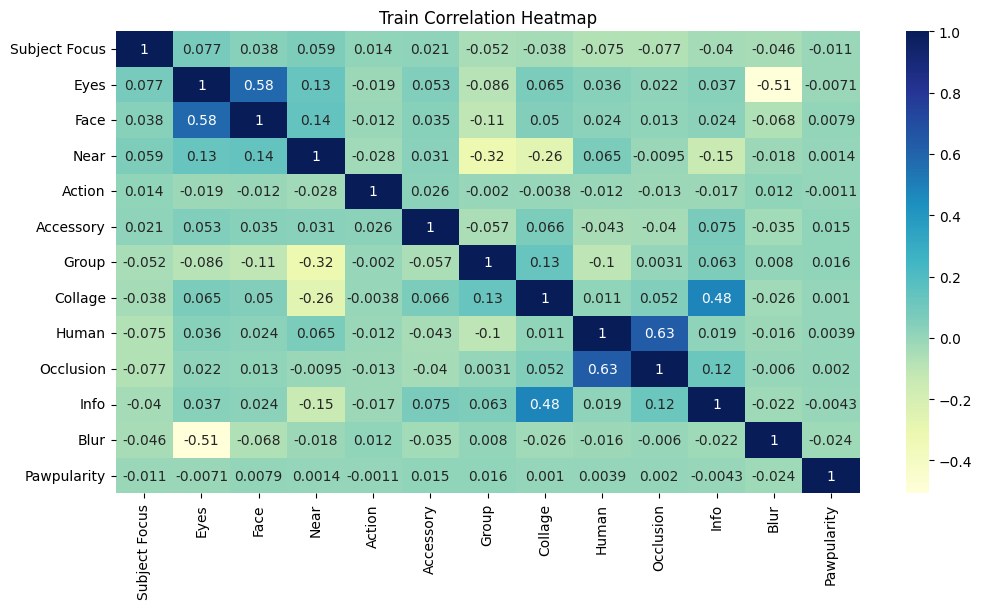

In [14]:
# Plot correlation heatmap
plt.figure(figsize=(12, 6))
heatmap = sns.heatmap(train_df.iloc[:].corr(), annot=True, cmap='YlGnBu')
heatmap.set_title('Train Correlation Heatmap')

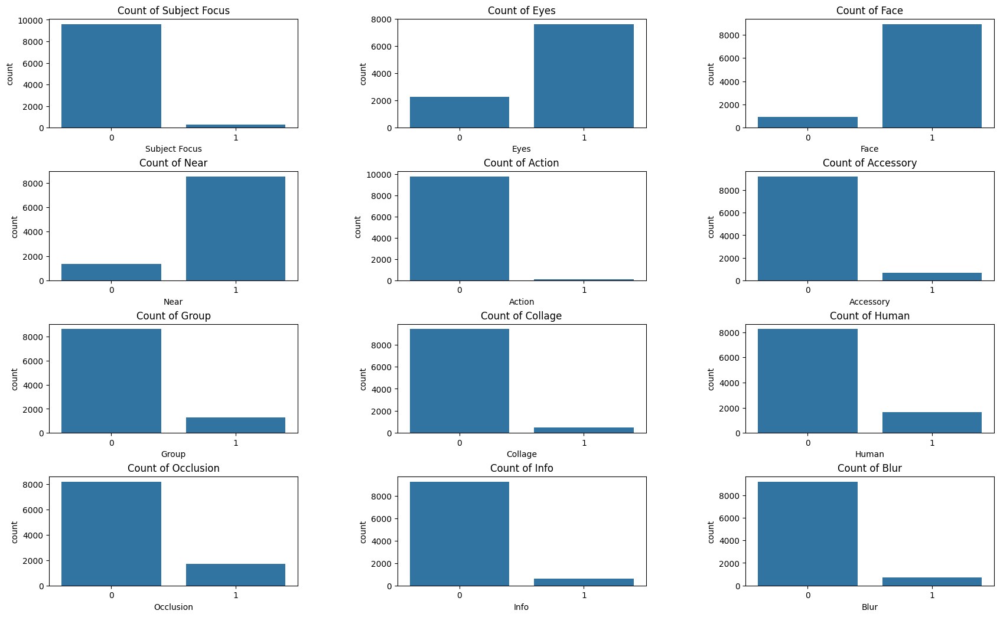

In [15]:
# Plot the count of every feature
columns= train_df.columns
i=0
j=0
k=0
fig, axs = plt.subplots(4, 3, figsize=(20,12))
for col in columns: 
    if (k < len(columns)-1) and (i!= 4):
        sns.countplot(data = train_df, x = col,ax = axs[i,j])
        axs[i,j].set_title(f'Count of {columns[k]}')
        if j==2:
            i+=1
            j=0
        else:
            j+=1
        k+=1
# set the spacing between subplots
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)
plt.show()


In [16]:
# Statistics summary
train_df.describe()

,Subject Focus,Eyes,Face,Near,Action,Accessory,Group,Collage,Human,Occlusion,Info,Blur,Pawpularity
count,9885.000000,9885.000000,9885.000000,9885.000000,9885.000000,9885.000000,9885.000000,9885.000000,9885.000000,9885.000000,9885.000000,9885.000000,9885.000000
mean,0.027618,0.772281,0.903794,0.861507,0.009914,0.067678,0.129287,0.049064,0.165908,0.171472,0.060799,0.070612,38.049975
std,0.163883,0.419381,0.294889,0.345434,0.099079,0.251206,0.335534,0.216013,0.372017,0.376940,0.238974,0.256189,20.599055
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,25.000000
50%,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,33.000000
75%,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,46.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,100.000000


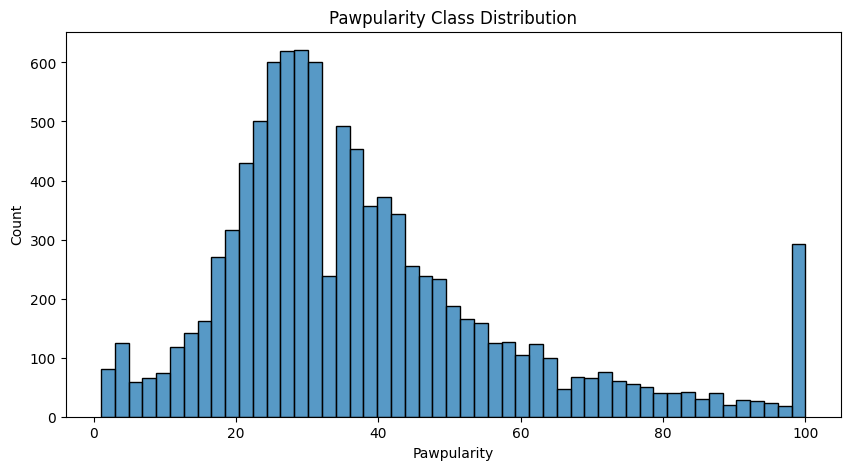

In [17]:
# Plot the target class distribution

# convert the labels array to a pandas dataframe
labels_df = pd.DataFrame(train_df['Pawpularity'], columns =['Pawpularity'])
# histogram
plt.figure(figsize=(10,5))
sns.histplot(data= labels_df, stat= 'count', x='Pawpularity')
plt.title('Pawpularity Class Distribution')
plt.xlabel("Pawpularity");

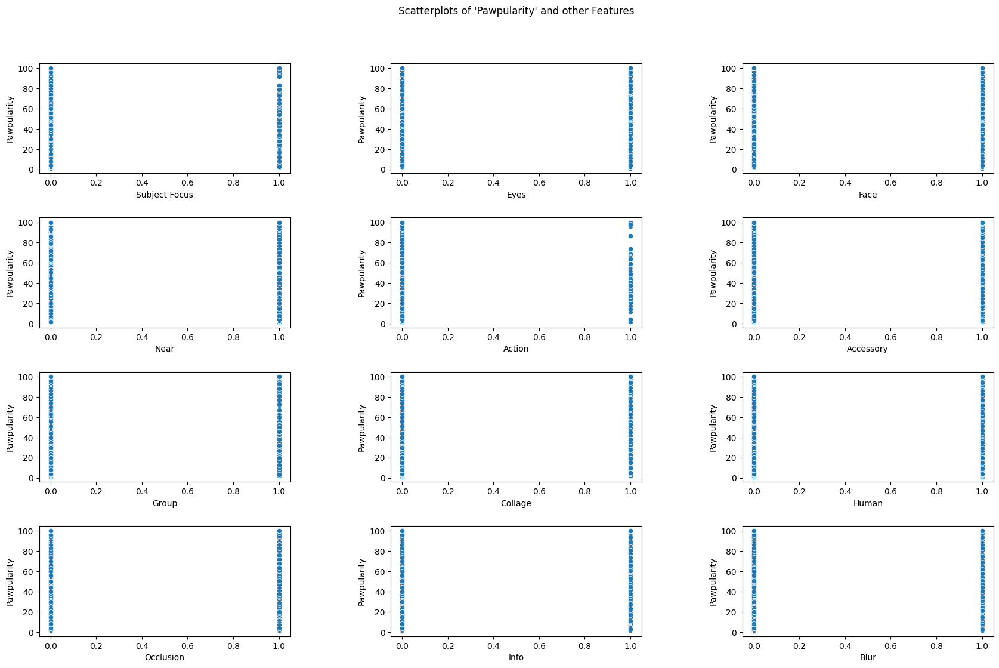

In [18]:
# Scatterplots of 'Pawpularity' and other features
columns= train_df.columns
i=0
j=0
k=0
fig, axs = plt.subplots(4, 3, figsize=(20,12))
for col in columns: 
    if (k < len(columns)-1) and (i!= 4):
        sns.scatterplot(data = train_df, x = col,y= 'Pawpularity',ax = axs[i,j])
        if j==2:
            i+=1
            j=0
        else:
            j+=1
        k+=1
# set the spacing between subplots
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)
fig.suptitle('Scatterplots of \'Pawpularity\' and other Features')
plt.show()


### Step 4: Preprocess Data

In [65]:
# Class with class variables we can access throughout
class CF :
    resize_flag = True
    image_size = [224, 224]
    brightness_flag = False
    bright = 0.5
    contrast_flag = False
    contrast = [0.5, 1.5]
    hue_flag = False
    hue = 0.1
    sat_flag = False
    sat = [0.5, 1.5]
    flip_lr_flag = False
    flip_ud_flag = False
    zoom_flag = False
    zoom = [0.5, 0.25]
    def __repr__(self):
        config_string = "\n resize_flag : " + str(self.resize_flag) + ", image_size : " + ' '.join(str(size) for size in self.image_size)
        config_string += "\n brightness_flag : " + str(self.brightness_flag) + ", max_delta : " + str(self.bright)
        config_string += "\n contrast_flag : " + str(self.contrast_flag) +", min / max : " + ' '.join(str(c) for c in self.contrast)
        config_string += "\n hue_flag : " + str(self.hue_flag) + ", max_delta : " + str(self.hue)
        config_string += "\n sat_flag : " + str(self.sat) + ", min / max : " + ' '.join(str(s) for s in self.sat)
        config_string += "\n flip_lr_flag : " + str(self.flip_lr_flag)
        config_string += "\n flip_ud_flag : " + str(self.flip_ud_flag)
        config_string += "\n zoom_flag : " + str(self.zoom_flag) +", min / max : " + ' '.join(str(z) for z in self.zoom)

        return config_string

In [77]:
# Preprocessing 
train_df = train_df.reset_index()
labels = list(train_df['Pawpularity']/1.0)
train_files, test_files, labels_train, labels_test = train_test_split(new_file_names, labels, test_size=0.2, random_state=137)
train_files, val_files, labels_train, labels_val = train_test_split(train_files, labels_train, test_size=0.2, random_state=137)

def process_file_names(file_name, label):
    image_string = tf.io.read_file(file_name)
    img = tf.io.decode_jpeg(image_string, channels=3)
    
    # Image augmentation - Apply any true preprocessing feature
    if CF.resize_flag == True :        
        img = tf.image.resize(img, CF.image_size)
    if CF.brightness_flag == True :
        img = tf.image.random_brightness(img, max_delta = CF.bright)
    if CF.contrast_flag == True :
        img = tf.image.random_contrast(img, CF.contrast[0], CF.contrast[1])
    if CF.hue_flag == True :
        img = tf.image.random_hue(img, max_delta = CF.hue)
    if CF.sat_flag == True :
        img = tf.image.random_saturation(img, CF.sat[0], CF.sat[1])        
    if CF.flip_lr_flag == True :
        img = tf.image.random_flip_left_right(img)
    if CF.flip_ud_flag == True :
        img = tf.image.random_flip_up_down(img)

    
    # rescale labels so between 0 and 1
    return img, label/100.01

In [78]:
# Print the current configuration modifications on the originals
print(CF().__repr__())


 resize_flag : True, image_size : 224 224
 brightness_flag : False, max_delta : 0.5
 contrast_flag : False, min / max : 0.5 1.5
 hue_flag : False, max_delta : 0.1
 sat_flag : [0.5, 1.5], min / max : 0.5 1.5
 flip_lr_flag : False
 flip_ud_flag : False
 zoom_flag : False, min / max : 0.5 0.25


In [79]:
# processing  file names in the test set without data augmentation
test_dataset = tf.data.Dataset.from_tensor_slices((test_files, labels_test))
test_dataset = test_dataset.map(process_file_names)

# processing  file names in the train set with data augmentation
# Turn on all flags
CF.brightness_flag = True
CF.contrast_flag = True
CF.hue_flag = True
CF.sat_flag = True
CF.flip_lr_flag = True
CF.flip_ud_flag = True

train_dataset = tf.data.Dataset.from_tensor_slices((train_files, labels_train))
train_dataset = train_dataset.map(process_file_names)
val_dataset = tf.data.Dataset.from_tensor_slices((val_files, labels_val))
val_dataset = val_dataset.map(process_file_names)

In [80]:
# Print the current configuration modifications on the originals
print(CF().__repr__())


 resize_flag : True, image_size : 224 224
 brightness_flag : True, max_delta : 0.5
 contrast_flag : True, min / max : 0.5 1.5
 hue_flag : True, max_delta : 0.1
 sat_flag : [0.5, 1.5], min / max : 0.5 1.5
 flip_lr_flag : True
 flip_ud_flag : True
 zoom_flag : False, min / max : 0.5 0.25


In [81]:
# Configuring performance
def configure_for_performance(ds):
    ds = ds.cache()
    ds = ds.shuffle(buffer_size=1000)
    ds = ds.batch(32)
    return ds
    
train_dataset = configure_for_performance(train_dataset)
val_dataset = configure_for_performance(val_dataset)
test_dataset = configure_for_performance(test_dataset)

In [42]:
# Show the modified images in the batch data set

def show_tfbatch_images(dataset) :
    
    for images, labels in dataset.take(1):  # only take first element of dataset
        numpy_images = images.numpy()
        numpy_labels = labels.numpy()

    nrows, ncols = 5,5 #print first 25 images
    f, axs = plt.subplots(nrows, ncols, figsize=(30,20))
    for i in range(nrows):
        for j in range(ncols):
            indx = i*ncols+j
            axs[i,j].imshow(array_to_img(numpy_images[indx]))
            axs[i,j].set(title=numpy_labels[indx])
    return

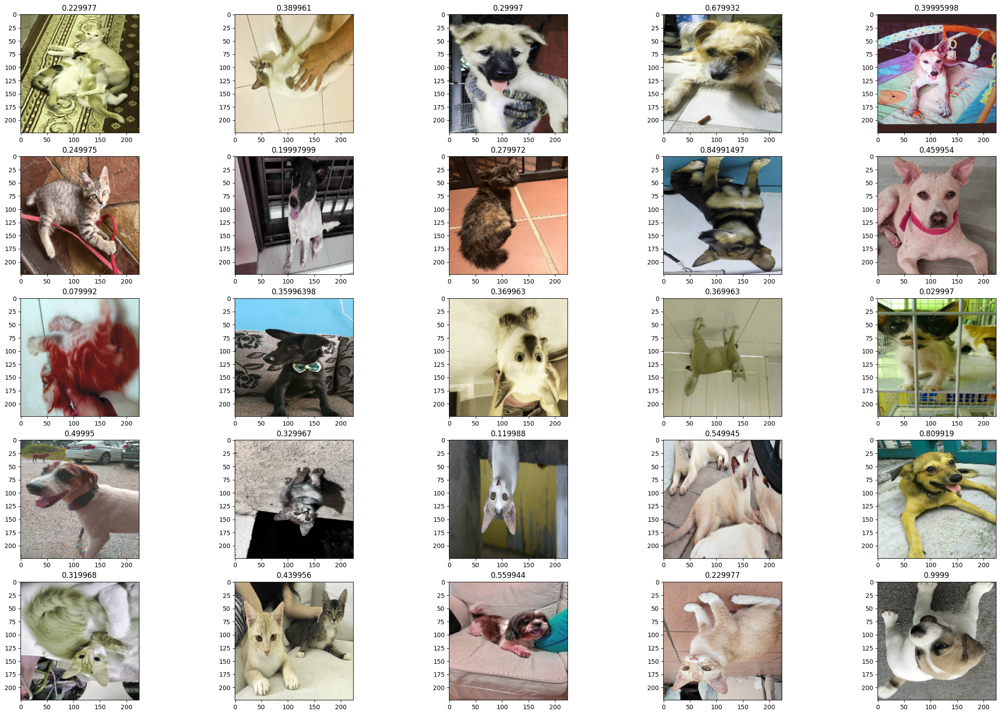

In [43]:
show_tfbatch_images(train_dataset)

### Step 5: Modeling and Evaluation

### <span style="color:chocolate"> Baseline Model  </span>

#### Dummy Model

Predict Mean Pawpularity Score

In [26]:
# Baseline: Mean Pawpularity Score
y = train_df['Pawpularity'].to_numpy()
X = train_df.drop(columns=['Pawpularity']).to_numpy()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=137)

In [27]:
# Dummy model
dummy_model = DummyRegressor(strategy='mean')
dummy_model.fit(X_train, y_train)
y_pred = dummy_model.predict(X_test)
np.sqrt(mean_squared_error(y_pred, y_test))

20.42747312170261

In [28]:
# Cross validation score
dummy_model = DummyRegressor(strategy='mean')
scores = cross_val_score(dummy_model, X, y, cv=10, scoring='neg_root_mean_squared_error')
print("%0.2f RMSE with a standard deviation of %0.2f" % (-scores.mean(), scores.std()))

20.59 RMSE with a standard deviation of 0.52


### <span style="color:chocolate"> Improvement on Baseline Model  </span>

### ResNet

In [88]:
# Define residual layer

class ResidualUnit(tf.keras.layers.Layer):
    def __init__(self, filters, strides=1, activation='relu', **kwargs):
        super().__init__(**kwargs)
        self.activation = tf.keras.activations.get(activation)
        self.main_layers = [
            tf.keras.layers.Conv2D(filters, kernel_size=3, strides=strides, padding='same', kernel_initializer='he_normal', use_bias=False),
            tf.keras.layers.BatchNormalization(),
            self.activation,
            tf.keras.layers.Conv2D(filters, kernel_size=3, strides=1, padding='same', kernel_initializer='he_normal', use_bias=False),
            tf.keras.layers.BatchNormalization()
        ]
        # If strides > 1 need to use 1D convolutions with long stride to resize image so they can be added
        if strides == 1:
            self.skip_layers = []
        else:
            self.skip_layers = [
                tf.keras.layers.Conv2D(filters, kernel_size=1, strides=strides, padding='same', kernel_initializer='he_normal', use_bias=False),
                tf.keras.layers.BatchNormalization()
            ]
    def call(self, inputs):
        z = inputs
        for layer in self.main_layers:
            z = layer(z)
        skip_z = inputs
        for layer in self.skip_layers:
            skip_z = layer(skip_z)
        # either return a(z) + skip_z or a(z + skip_z)
        return self.activation(z + skip_z)

In [89]:
# Define ResNet

def build_resnet():
    tf.keras.backend.clear_session()
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Conv2D(64, kernel_size=7, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False, input_shape=[224,224,3]))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Activation('relu'))
    model.add(tf.keras.layers.MaxPooling2D(pool_size=3, strides=2, padding='same'))
    prev_filters = 128
    for filters in [64, 64, 128, 256, 512]:
        strides = 1 if filters == prev_filters else 2
        model.add(ResidualUnit(filters, strides=strides))
        prev_filters = filters


    model.add(tf.keras.layers.GlobalAvgPool2D())
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dropout(0.25))
    model.add(tf.keras.layers.Dense(units=1, activation="sigmoid"))
    model.compile(optimizer=tf.keras.optimizers.legacy.Adam(),
                  loss="binary_crossentropy",
                  metrics=[tf.keras.metrics.RootMeanSquaredError()])
    return model


In [90]:
# build model
resnet = build_resnet()

# use early stopping
early_stopping_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, verbose=1, restore_best_weights=True)

# Train the model
history_rn = resnet.fit(train_dataset,
                  epochs=10,
                  validation_data=val_dataset,
                  verbose=1,
                  callbacks=[early_stopping_callback])

Epoch 1/10
198/198 [==============================] - 218s 1s/step - loss: 0.7184 - root_mean_squared_error: 0.2489 - val_loss: 0.6941 - val_root_mean_squared_error: 0.2373
Epoch 2/10
198/198 [==============================] - 211s 1s/step - loss: 0.6771 - root_mean_squared_error: 0.2200 - val_loss: 0.6702 - val_root_mean_squared_error: 0.2106
Epoch 3/10
198/198 [==============================] - 225s 1s/step - loss: 0.6731 - root_mean_squared_error: 0.2160 - val_loss: 0.6724 - val_root_mean_squared_error: 0.2136
Epoch 4/10
198/198 [==============================] - 238s 1s/step - loss: 0.6651 - root_mean_squared_error: 0.2074 - val_loss: 0.6741 - val_root_mean_squared_error: 0.2138
Epoch 5/10
198/198 [==============================] - 216s 1s/step - loss: 0.6598 - root_mean_squared_error: 0.2013 - val_loss: 0.6715 - val_root_mean_squared_error: 0.2125
Epoch 6/10
198/198 [==============================] - 221s 1s/step - loss: 0.6543 - root_mean_squared_error: 0.1946 - val_loss: 0.6791 

In [91]:
resnet.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 112, 112, 64)      9408      
                                                                 
 batch_normalization (BatchN  (None, 112, 112, 64)     256       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 112, 112, 64)      0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 56, 56, 64)       0         
 )                                                               
                                                                 
 residual_unit (ResidualUnit  (None, 28, 28, 64)       78592     
 )                                                               
                                                        

In [96]:
resnet_hist = pd.DataFrame(history_rn.history)
display(resnet_hist)

,loss,root_mean_squared_error,val_loss,val_root_mean_squared_error
0,0.718416,0.248925,0.694076,0.237298
1,0.677105,0.219987,0.670159,0.210629
2,0.673112,0.215950,0.672431,0.213597
3,0.665052,0.207367,0.674072,0.213813
4,0.659790,0.201312,0.671505,0.212516
5,0.654293,0.194645,0.679150,0.219969
6,0.642428,0.179652,0.684149,0.225102


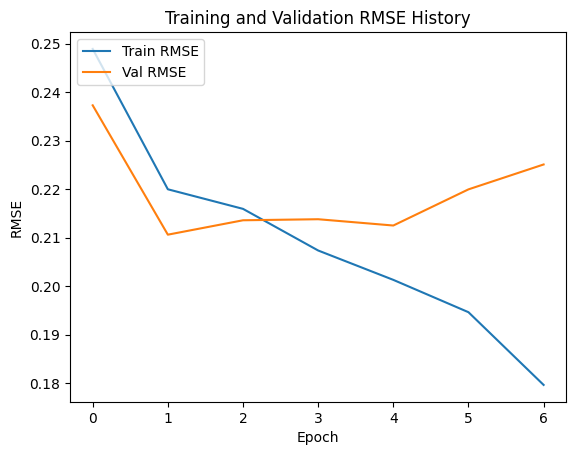

In [97]:
# Plot the training & validation RMSE

plt.rcdefaults() # reset to rc default values
plt.plot(resnet_hist['root_mean_squared_error'])
plt.plot(resnet_hist['val_root_mean_squared_error'])

plt.title("Training and Validation RMSE History")
plt.xlabel("Epoch")
plt.ylabel("RMSE")

plt.legend(["Train RMSE", "Val RMSE"], loc ="upper left")

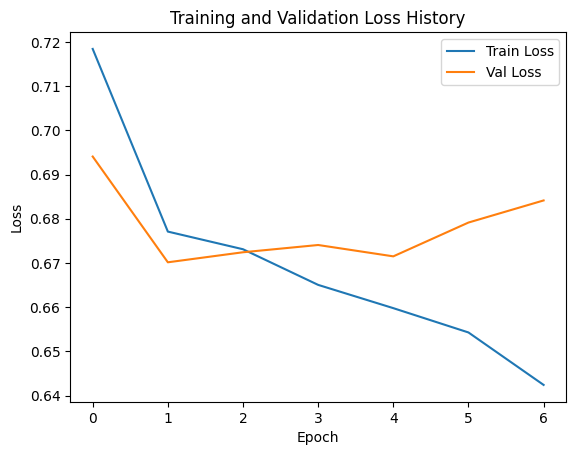

In [98]:
# Plot the training & validation loss

plt.plot(resnet_hist['loss'])
plt.plot(resnet_hist['val_loss'])

plt.title("Training and Validation Loss History")
plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.legend(["Train Loss", "Val Loss"], loc ="upper right")

### ResNet Evaluation

In [100]:
# Pawpularity scores 
pawp_scores = resnet.evaluate(test_dataset, verbose = 1) 
print('Test loss:', pawp_scores[0]) 
print('Test RMSE:', pawp_scores[1])

62/62 [==============================] - 8s 130ms/step - loss: 0.6654 - root_mean_squared_error: 0.2063
Test loss: 0.6653962135314941
Test RMSE: 0.20633921027183533


### ResNet with Learning Rate Scheduler

#### Learning Rate Schedule that uses a cosine decay with optional warmup
##### Warmup
def warmup_learning_rate(step):

    completed_fraction = step / warmup_steps
    
    total_delta = target_warmup - initial_learning_rate
    
    return completed_fraction * total_delta

##### Decay
if warmup_target is None:

    initial_decay_lr = initial_learning_rate
    
else:

    initial_decay_lr = warmup_target

def decayed_learning_rate(step):

    step = min(step, decay_steps)
    
    cosine_decay = 0.5 * (1 + cos(pi * step / decay_steps))
    
    decayed = (1 - alpha) * cosine_decay + alpha
    
    return initial_decay_lr * decayed

### Model 1

In [117]:
# Define ResNet with learning rate scheduler

def build_resnet_LRS():
    tf.keras.backend.clear_session()
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Conv2D(64, kernel_size=7, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False, input_shape=[224,224,3]))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Activation('relu'))
    model.add(tf.keras.layers.MaxPooling2D(pool_size=3, strides=2, padding='same'))
    prev_filters = 128
    for filters in [64, 64, 128, 256, 512]:
        strides = 1 if filters == prev_filters else 2
        model.add(ResidualUnit(filters, strides=strides))
        prev_filters = filters


    model.add(tf.keras.layers.GlobalAvgPool2D())
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dropout(0.25))
    model.add(tf.keras.layers.Dense(units=1, activation="sigmoid"))

    # Learning rate scheduler
    initial_learning_rate = 0.1
    decay_steps = 1000   
    target_learning_rate = 1e-4
    warmup_steps = 1000
    
    cos_lr_schedule = tf.keras.optimizers.schedules.CosineDecay( initial_learning_rate, decay_steps) 
    optimizer_lrs = tf.keras.optimizers.legacy.Adam(learning_rate=cos_lr_schedule)
    
    model.compile(optimizer=optimizer_lrs,
                  loss="binary_crossentropy",
                  metrics=[tf.keras.metrics.RootMeanSquaredError()])
    return model


In [118]:
# build model
resnet_lrs = build_resnet_LRS()

# use early stopping
early_stopping_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, verbose=1, restore_best_weights=True)

# Train the model
history_rn_lrs = resnet_lrs.fit(train_dataset,
                                epochs=10,
                                validation_data=val_dataset,
                                verbose=1,
                                callbacks=[early_stopping_callback])

Epoch 1/10
198/198 [==============================] - 257s 1s/step - loss: 0.7953 - root_mean_squared_error: 0.2390 - val_loss: 0.8017 - val_root_mean_squared_error: 0.2763
Epoch 2/10
198/198 [==============================] - 267s 1s/step - loss: 0.6651 - root_mean_squared_error: 0.2076 - val_loss: 0.6666 - val_root_mean_squared_error: 0.2068
Epoch 3/10
198/198 [==============================] - 259s 1s/step - loss: 0.6645 - root_mean_squared_error: 0.2069 - val_loss: 0.6662 - val_root_mean_squared_error: 0.2063
Epoch 4/10
198/198 [==============================] - 259s 1s/step - loss: 0.6641 - root_mean_squared_error: 0.2065 - val_loss: 0.6662 - val_root_mean_squared_error: 0.2064
Epoch 5/10
198/198 [==============================] - 259s 1s/step - loss: 0.6638 - root_mean_squared_error: 0.2061 - val_loss: 0.6662 - val_root_mean_squared_error: 0.2064
Epoch 6/10
198/198 [==============================] - 257s 1s/step - loss: 0.6637 - root_mean_squared_error: 0.2060 - val_loss: 0.6662 

In [166]:
resnet_lrs.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 112, 112, 64)      9408      
                                                                 
 batch_normalization (BatchN  (None, 112, 112, 64)     256       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 112, 112, 64)      0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 56, 56, 64)       0         
 )                                                               
                                                                 
 residual_unit (ResidualUnit  (None, 28, 28, 64)       78592     
 )                                                               
                                                        

In [167]:
resnet_lrs_hist = pd.DataFrame(history_rn_lrs.history)
display(resnet_lrs_hist)

,loss,root_mean_squared_error,val_loss,val_root_mean_squared_error
0,0.795270,0.239049,0.801658,0.276311
1,0.665133,0.207597,0.666583,0.206752
2,0.664520,0.206920,0.666197,0.206317
3,0.664146,0.206492,0.666241,0.206366
4,0.663789,0.206079,0.666244,0.206371
5,0.663711,0.205989,0.666244,0.206371
6,0.663693,0.205969,0.666247,0.206374
7,0.663623,0.205889,0.666249,0.206377


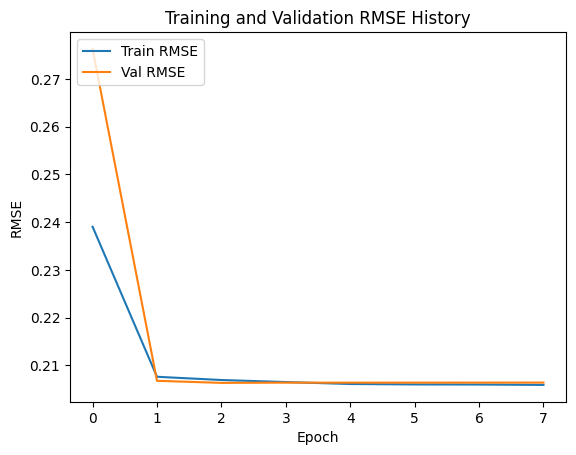

In [168]:
# Plot the training & validation RMSE

plt.rcdefaults() # reset to rc default values
plt.plot(resnet_lrs_hist['root_mean_squared_error'])
plt.plot(resnet_lrs_hist['val_root_mean_squared_error'])

plt.title("Training and Validation RMSE History")
plt.xlabel("Epoch")
plt.ylabel("RMSE")

plt.legend(["Train RMSE", "Val RMSE"], loc ="upper left")

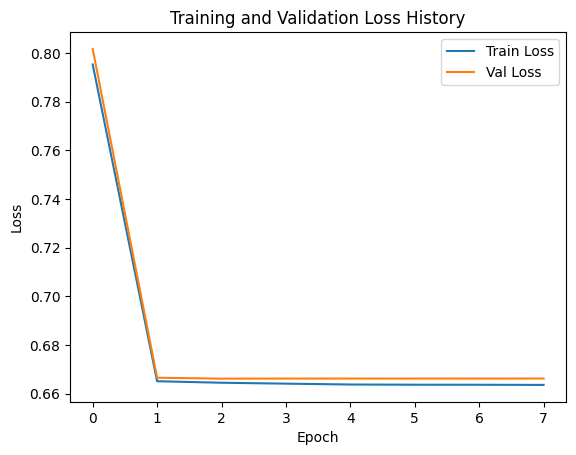

In [169]:
# Plot the training & validation loss

plt.plot(resnet_lrs_hist['loss'])
plt.plot(resnet_lrs_hist['val_loss'])

plt.title("Training and Validation Loss History")
plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.legend(["Train Loss", "Val Loss"], loc ="upper right")

### ResNet with Learning Rate Scheduler Evaluation - Model 1

In [119]:
# Pawpularity scores 
pawp_scores_lrs = resnet_lrs.evaluate(test_dataset, verbose = 1) 
print('Test loss:', pawp_scores_lrs[0]) 
print('Test RMSE:', pawp_scores_lrs[1])

62/62 [==============================] - 13s 215ms/step - loss: 0.6636 - root_mean_squared_error: 0.2043
Test loss: 0.6635511517524719
Test RMSE: 0.20434308052062988


### ResNet with Learning Rate Scheduler Prediction - Model 1

In [165]:
# Predictions on Testing data
resnet_lrs.predict(test_dataset)

62/62 [==============================] - 9s 132ms/step


array([[0.37996095],
       [0.38466823],
       [0.3937301 ],
       ...,
       [0.3911184 ],
       [0.3884541 ],
       [0.3831165 ]], dtype=float32)

### Model 2

In [120]:
# Define ResNet with learning rate scheduler

def build_resnet_LRS2():
    tf.keras.backend.clear_session()
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Conv2D(64, kernel_size=7, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False, input_shape=[224,224,3]))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Activation('relu'))
    model.add(tf.keras.layers.MaxPooling2D(pool_size=3, strides=2, padding='same'))
    prev_filters = 128
    for filters in [64, 64, 128, 256, 512]:
        strides = 1 if filters == prev_filters else 2
        model.add(ResidualUnit(filters, strides=strides))
        prev_filters = filters


    model.add(tf.keras.layers.GlobalAvgPool2D())
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dropout(0.25))
    model.add(tf.keras.layers.Dense(units=1, activation="sigmoid"))

    # Learning rate scheduler
    initial_learning_rate = 0.001
    decay_steps = 1000   
    target_learning_rate = 1e-7
    warmup_steps = 1000
    
    cos_lr_schedule = tf.keras.optimizers.schedules.CosineDecay( initial_learning_rate, decay_steps) 
    optimizer_lrs = tf.keras.optimizers.legacy.Adam(learning_rate=cos_lr_schedule)
    
    model.compile(optimizer=optimizer_lrs,
                  loss="binary_crossentropy",
                  metrics=[tf.keras.metrics.RootMeanSquaredError()])
    return model

In [121]:
# build model
resnet_lrs2 = build_resnet_LRS2()

# use early stopping
early_stopping_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, verbose=1, restore_best_weights=True)

# Train the model
history_rn_lrs2 = resnet_lrs2.fit(train_dataset,
                                epochs=10,
                                validation_data=val_dataset,
                                verbose=1,
                                callbacks=[early_stopping_callback])

Epoch 1/10
198/198 [==============================] - 263s 1s/step - loss: 0.7205 - root_mean_squared_error: 0.2470 - val_loss: 0.7179 - val_root_mean_squared_error: 0.2445
Epoch 2/10
198/198 [==============================] - 243s 1s/step - loss: 0.6814 - root_mean_squared_error: 0.2231 - val_loss: 0.6815 - val_root_mean_squared_error: 0.2193
Epoch 3/10
198/198 [==============================] - 241s 1s/step - loss: 0.6688 - root_mean_squared_error: 0.2113 - val_loss: 0.6676 - val_root_mean_squared_error: 0.2079
Epoch 4/10
198/198 [==============================] - 240s 1s/step - loss: 0.6587 - root_mean_squared_error: 0.1999 - val_loss: 0.6716 - val_root_mean_squared_error: 0.2127
Epoch 5/10
198/198 [==============================] - 241s 1s/step - loss: 0.6470 - root_mean_squared_error: 0.1856 - val_loss: 0.6705 - val_root_mean_squared_error: 0.2111
Epoch 6/10
198/198 [==============================] - 241s 1s/step - loss: 0.6431 - root_mean_squared_error: 0.1807 - val_loss: 0.6708 

### ResNet with Learning Rate Scheduler Evaluation - Model 2

In [122]:
# Pawpularity scores 
pawp_scores_lrs2 = resnet_lrs2.evaluate(test_dataset, verbose = 1) 
print('Test loss:', pawp_scores_lrs2[0]) 
print('Test RMSE:', pawp_scores_lrs2[1])

62/62 [==============================] - 7s 108ms/step - loss: 0.6646 - root_mean_squared_error: 0.2056
Test loss: 0.6645634770393372
Test RMSE: 0.20555485785007477


### Model 3

In [126]:
# Define ResNet with learning rate scheduler

def build_resnet_LRS3():
    tf.keras.backend.clear_session()
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Conv2D(64, kernel_size=7, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False, input_shape=[224,224,3]))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Activation('relu'))
    model.add(tf.keras.layers.MaxPooling2D(pool_size=3, strides=2, padding='same'))
    prev_filters = 128
    for filters in [64]*3 + [128]*4 + [256]*6 + [512]*3:
        strides = 1 if filters == prev_filters else 2
        model.add(ResidualUnit(filters, strides=strides))
        prev_filters = filters


    model.add(tf.keras.layers.GlobalAvgPool2D())
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dropout(0.25))
    model.add(tf.keras.layers.Dense(units=1, activation="sigmoid"))

    # Learning rate scheduler
    initial_learning_rate = 0.0001
    decay_steps = 1000   
    target_learning_rate = 1e-9
    warmup_steps = 1000
    
    cos_lr_schedule = tf.keras.optimizers.schedules.CosineDecay( initial_learning_rate, decay_steps) 
    optimizer_lrs = tf.keras.optimizers.legacy.Adam(learning_rate=cos_lr_schedule)
    
    model.compile(optimizer=optimizer_lrs,
                  loss="binary_crossentropy",
                  metrics=[tf.keras.metrics.RootMeanSquaredError()])
    return model

In [127]:
# build model
resnet_lrs3 = build_resnet_LRS3()

# use early stopping
early_stopping_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, verbose=1, restore_best_weights=True)

# Train the model
history_rn_lrs3 = resnet_lrs3.fit(train_dataset,
                                epochs=10,
                                validation_data=val_dataset,
                                verbose=1,
                                callbacks=[early_stopping_callback])

Epoch 1/10
198/198 [==============================] - 430s 2s/step - loss: 0.7710 - root_mean_squared_error: 0.2821 - val_loss: 0.7150 - val_root_mean_squared_error: 0.2331
Epoch 2/10
198/198 [==============================] - 416s 2s/step - loss: 0.7301 - root_mean_squared_error: 0.2611 - val_loss: 0.6834 - val_root_mean_squared_error: 0.2251
Epoch 3/10
198/198 [==============================] - 403s 2s/step - loss: 0.6994 - root_mean_squared_error: 0.2366 - val_loss: 0.6872 - val_root_mean_squared_error: 0.2264
Epoch 4/10
198/198 [==============================] - 425s 2s/step - loss: 0.6670 - root_mean_squared_error: 0.2040 - val_loss: 0.6919 - val_root_mean_squared_error: 0.2311
Epoch 5/10
198/198 [==============================] - 398s 2s/step - loss: 0.6516 - root_mean_squared_error: 0.1857 - val_loss: 0.6921 - val_root_mean_squared_error: 0.2313
Epoch 6/10
198/198 [==============================] - 406s 2s/step - loss: 0.6461 - root_mean_squared_error: 0.1791 - val_loss: 0.6909 

### ResNet with Learning Rate Scheduler Evaluation - Model 3

In [128]:
# Pawpularity scores 
pawp_scores_lrs3 = resnet_lrs3.evaluate(test_dataset, verbose = 1) 
print('Test loss:', pawp_scores_lrs3[0]) 
print('Test RMSE:', pawp_scores_lrs3[1])

62/62 [==============================] - 27s 427ms/step - loss: 0.6851 - root_mean_squared_error: 0.2287
Test loss: 0.6850912570953369
Test RMSE: 0.2287236601114273


### DIDL
https://d2l.ai/chapter_optimization/lr-scheduler.html

In [149]:
from tensorflow.keras.callbacks import LearningRateScheduler
import math

class CosineScheduler:
    def __init__(self, max_update, base_lr=0.01, final_lr=0,
               warmup_steps=0, warmup_begin_lr=0):
        self.base_lr_orig = base_lr
        self.max_update = max_update
        self.final_lr = final_lr
        self.warmup_steps = warmup_steps
        self.warmup_begin_lr = warmup_begin_lr
        self.max_steps = self.max_update - self.warmup_steps

    def get_warmup_lr(self, epoch):
        increase = (self.base_lr_orig - self.warmup_begin_lr) \
                       * float(epoch) / float(self.warmup_steps)
        return self.warmup_begin_lr + increase

    def __call__(self, epoch):
        if epoch < self.warmup_steps:
            return self.get_warmup_lr(epoch)
        if epoch <= self.max_update:
            self.base_lr = self.final_lr + (
                self.base_lr_orig - self.final_lr) * (1 + math.cos(
                math.pi * (epoch - self.warmup_steps) / self.max_steps)) / 2
        return self.base_lr

scheduler = CosineScheduler(max_update=20,warmup_steps=5, base_lr=0.3, final_lr=0.01)

### Model 4

In [150]:
# Define ResNet with learning rate scheduler

def build_resnet_LRS4():
    tf.keras.backend.clear_session()
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Conv2D(64, kernel_size=7, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False, input_shape=[224,224,3]))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Activation('relu'))
    model.add(tf.keras.layers.MaxPooling2D(pool_size=3, strides=2, padding='same'))
    prev_filters = 128
    for filters in [64, 64, 128, 256, 512]:
        strides = 1 if filters == prev_filters else 2
        model.add(ResidualUnit(filters, strides=strides))
        prev_filters = filters


    model.add(tf.keras.layers.GlobalAvgPool2D())
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dropout(0.25))
    model.add(tf.keras.layers.Dense(units=1, activation="sigmoid"))
    
    model.compile(optimizer=tf.keras.optimizers.legacy.Adam(0.3),
                  loss="binary_crossentropy",
                  metrics=[tf.keras.metrics.RootMeanSquaredError()])
    return model


In [151]:
# build model
resnet_lrs4 = build_resnet_LRS4()

# Train the model
history_rn_lrs4 = resnet_lrs4.fit(train_dataset,
                                epochs=10,
                                validation_data=val_dataset,
                                verbose=1,
                                callbacks=[LearningRateScheduler(scheduler)])

Epoch 1/10
198/198 [==============================] - 177s 889ms/step - loss: 0.7180 - root_mean_squared_error: 0.2592 - val_loss: 0.6949 - val_root_mean_squared_error: 0.2363 - lr: 0.0000e+00
Epoch 2/10
198/198 [==============================] - 173s 876ms/step - loss: 0.7694 - root_mean_squared_error: 0.2170 - val_loss: 0.6945 - val_root_mean_squared_error: 0.2279 - lr: 0.0600
Epoch 3/10
198/198 [==============================] - 169s 853ms/step - loss: 0.6647 - root_mean_squared_error: 0.2071 - val_loss: 0.6672 - val_root_mean_squared_error: 0.2075 - lr: 0.1200
Epoch 4/10
198/198 [==============================] - 170s 859ms/step - loss: 0.6651 - root_mean_squared_error: 0.2075 - val_loss: 0.6675 - val_root_mean_squared_error: 0.2078 - lr: 0.1800
Epoch 5/10
198/198 [==============================] - 171s 865ms/step - loss: 0.6656 - root_mean_squared_error: 0.2081 - val_loss: 0.6663 - val_root_mean_squared_error: 0.2064 - lr: 0.2400
Epoch 6/10
198/198 [==============================]

### ResNet with Learning Rate Scheduler Evaluation - Model 4

In [152]:
# Pawpularity scores 
pawp_scores_lrs4 = resnet_lrs4.evaluate(test_dataset, verbose = 1) 
print('Test loss:', pawp_scores_lrs4[0]) 
print('Test RMSE:', pawp_scores_lrs4[1])

62/62 [==============================] - 9s 139ms/step - loss: 0.6776 - root_mean_squared_error: 0.2180
Test loss: 0.6776179671287537
Test RMSE: 0.2180263102054596


### Model 5

In [159]:
# Define ResNet with learning rate scheduler

def build_resnet_LRS5():
    tf.keras.backend.clear_session()
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Conv2D(64, kernel_size=7, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False, input_shape=[224,224,3]))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Activation('relu'))
    model.add(tf.keras.layers.MaxPooling2D(pool_size=3, strides=2, padding='same'))
    prev_filters = 128
    for filters in [64, 64, 128, 256, 512]:
        strides = 1 if filters == prev_filters else 2
        model.add(ResidualUnit(filters, strides=strides))
        prev_filters = filters


    model.add(tf.keras.layers.GlobalAvgPool2D())
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dropout(0.25))
    model.add(tf.keras.layers.Dense(units=1, activation="sigmoid"))
    
    model.compile(optimizer=tf.keras.optimizers.legacy.SGD(0.1),
                  loss="binary_crossentropy",
                  metrics=[tf.keras.metrics.RootMeanSquaredError()])
    return model

In [160]:
# build model
resnet_lrs5 = build_resnet_LRS5()

# Learning rate scheduler
cos_lr_scheduler = CosineScheduler(max_update=20,warmup_steps=5, base_lr=0.1, final_lr=1e-4) 

# Train the model
history_rn_lrs5 = resnet_lrs5.fit(train_dataset,
                                epochs=10,
                                validation_data=val_dataset,
                                verbose=1,
                                callbacks=[LearningRateScheduler(cos_lr_scheduler)])

Epoch 1/10
198/198 [==============================] - 204s 1s/step - loss: 0.8745 - root_mean_squared_error: 0.3585 - val_loss: 0.9385 - val_root_mean_squared_error: 0.3893 - lr: 0.0000e+00
Epoch 2/10
198/198 [==============================] - 189s 953ms/step - loss: 0.7004 - root_mean_squared_error: 0.2404 - val_loss: 0.6725 - val_root_mean_squared_error: 0.2127 - lr: 0.0200
Epoch 3/10
198/198 [==============================] - 187s 945ms/step - loss: 0.6911 - root_mean_squared_error: 0.2321 - val_loss: 0.7243 - val_root_mean_squared_error: 0.2659 - lr: 0.0400
Epoch 4/10
198/198 [==============================] - 185s 937ms/step - loss: 0.7085 - root_mean_squared_error: 0.2443 - val_loss: 0.7675 - val_root_mean_squared_error: 0.2754 - lr: 0.0600
Epoch 5/10
198/198 [==============================] - 186s 939ms/step - loss: 0.7142 - root_mean_squared_error: 0.2467 - val_loss: 0.8460 - val_root_mean_squared_error: 0.3129 - lr: 0.0800
Epoch 6/10
198/198 [==============================] - 

### ResNet with Learning Rate Scheduler Evaluation - Model 5

In [161]:
# Pawpularity scores 
pawp_scores_lrs5 = resnet_lrs5.evaluate(test_dataset, verbose = 1) 
print('Test loss:', pawp_scores_lrs5[0]) 
print('Test RMSE:', pawp_scores_lrs5[1])

62/62 [==============================] - 8s 134ms/step - loss: 0.6940 - root_mean_squared_error: 0.2382
Test loss: 0.6939986944198608
Test RMSE: 0.23819056153297424


### Model 6

In [162]:
# Define ResNet with learning rate scheduler

def build_resnet_LRS6():
    tf.keras.backend.clear_session()
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Conv2D(64, kernel_size=7, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False, input_shape=[224,224,3]))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Activation('relu'))
    model.add(tf.keras.layers.MaxPooling2D(pool_size=3, strides=2, padding='same'))
    prev_filters = 128
    for filters in [64, 64, 128, 256, 512]:
        strides = 1 if filters == prev_filters else 2
        model.add(ResidualUnit(filters, strides=strides))
        prev_filters = filters


    model.add(tf.keras.layers.GlobalAvgPool2D())
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dropout(0.25))
    model.add(tf.keras.layers.Dense(units=1, activation="sigmoid"))
    
    model.compile(optimizer=tf.keras.optimizers.legacy.Adam(0.1),
                  loss="binary_crossentropy",
                  metrics=[tf.keras.metrics.RootMeanSquaredError()])
    return model

In [163]:
# build model
resnet_lrs6 = build_resnet_LRS6()

# Learning rate scheduler
cos_scheduler = CosineScheduler(max_update=20,warmup_steps=5, base_lr=0.1, final_lr=1e-4) 

# Train the model
history_rn_lrs6 = resnet_lrs6.fit(train_dataset,
                                epochs=10,
                                validation_data=val_dataset,
                                verbose=1,
                                callbacks=[LearningRateScheduler(cos_scheduler)])

Epoch 1/10
198/198 [==============================] - 304s 2s/step - loss: 0.8122 - root_mean_squared_error: 0.2863 - val_loss: 0.8679 - val_root_mean_squared_error: 0.3037 - lr: 0.0000e+00
Epoch 2/10
198/198 [==============================] - 268s 1s/step - loss: 0.8026 - root_mean_squared_error: 0.2380 - val_loss: 0.7643 - val_root_mean_squared_error: 0.2411 - lr: 0.0200
Epoch 3/10
198/198 [==============================] - 279s 1s/step - loss: 0.6697 - root_mean_squared_error: 0.2113 - val_loss: 0.6694 - val_root_mean_squared_error: 0.2100 - lr: 0.0400
Epoch 4/10
198/198 [==============================] - 275s 1s/step - loss: 0.6659 - root_mean_squared_error: 0.2084 - val_loss: 0.6672 - val_root_mean_squared_error: 0.2074 - lr: 0.0600
Epoch 5/10
198/198 [==============================] - 272s 1s/step - loss: 0.6651 - root_mean_squared_error: 0.2075 - val_loss: 0.6679 - val_root_mean_squared_error: 0.2082 - lr: 0.0800
Epoch 6/10
198/198 [==============================] - 267s 1s/step

### ResNet with Learning Rate Scheduler Evaluation - Model 6

In [164]:
# Pawpularity scores 
pawp_scores_lrs6 = resnet_lrs6.evaluate(test_dataset, verbose = 1) 
print('Test loss:', pawp_scores_lrs6[0]) 
print('Test RMSE:', pawp_scores_lrs6[1])

62/62 [==============================] - 8s 132ms/step - loss: 0.6639 - root_mean_squared_error: 0.2048
Test loss: 0.6639001369476318
Test RMSE: 0.20477287471294403


### Model 7

In [170]:
# Define ResNet with learning rate scheduler

def build_resnet_LRS7():
    tf.keras.backend.clear_session()
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Conv2D(64, kernel_size=7, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False, input_shape=[224,224,3]))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Activation('relu'))
    model.add(tf.keras.layers.MaxPooling2D(pool_size=3, strides=2, padding='same'))
    prev_filters = 128
    for filters in [64, 64, 128, 256, 512]:
        strides = 1 if filters == prev_filters else 2
        model.add(ResidualUnit(filters, strides=strides))
        prev_filters = filters


    model.add(tf.keras.layers.GlobalAvgPool2D())
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dropout(0.25))
    model.add(tf.keras.layers.Dense(units=1, activation="sigmoid"))
    
    model.compile(optimizer=tf.keras.optimizers.legacy.SGD(0.3),
                  loss="binary_crossentropy",
                  metrics=[tf.keras.metrics.RootMeanSquaredError()])
    return model

In [171]:
# build model
resnet_lrs7 = build_resnet_LRS7()

# Train the model
history_rn_lrs7 = resnet_lrs7.fit(train_dataset,
                                epochs=10,
                                validation_data=val_dataset,
                                verbose=1,
                                callbacks=[LearningRateScheduler(scheduler)])

Epoch 1/10
198/198 [==============================] - 233s 1s/step - loss: 0.9509 - root_mean_squared_error: 0.3988 - val_loss: 0.9748 - val_root_mean_squared_error: 0.4113 - lr: 0.0000e+00
Epoch 2/10
198/198 [==============================] - 234s 1s/step - loss: 0.7365 - root_mean_squared_error: 0.2619 - val_loss: 0.6796 - val_root_mean_squared_error: 0.2195 - lr: 0.0600
Epoch 3/10
198/198 [==============================] - 236s 1s/step - loss: 0.7468 - root_mean_squared_error: 0.2561 - val_loss: 0.6909 - val_root_mean_squared_error: 0.2250 - lr: 0.1200
Epoch 4/10
198/198 [==============================] - 241s 1s/step - loss: 0.6916 - root_mean_squared_error: 0.2299 - val_loss: 0.6754 - val_root_mean_squared_error: 0.2143 - lr: 0.1800
Epoch 5/10
198/198 [==============================] - 245s 1s/step - loss: 0.6768 - root_mean_squared_error: 0.2190 - val_loss: 0.7647 - val_root_mean_squared_error: 0.2668 - lr: 0.2400
Epoch 6/10
198/198 [==============================] - 236s 1s/step

### ResNet with Learning Rate Scheduler Evaluation - Model 7

In [172]:
# Pawpularity scores 
pawp_scores_lrs7 = resnet_lrs7.evaluate(test_dataset, verbose = 1) 
print('Test loss:', pawp_scores_lrs7[0]) 
print('Test RMSE:', pawp_scores_lrs7[1])

62/62 [==============================] - 12s 193ms/step - loss: 0.6848 - root_mean_squared_error: 0.2275
Test loss: 0.6848317384719849
Test RMSE: 0.2275313138961792


### Learning Rate Schedule that uses exponential decay¶

def decayed_learning_rate(step):

    return initial_learning_rate * decay_rate ^ (step / decay_steps)

### Model 8

In [176]:
# Define ResNet with learning rate scheduler

def build_resnet_LRS8():
    tf.keras.backend.clear_session()
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Conv2D(64, kernel_size=7, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False, input_shape=[224,224,3]))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Activation('relu'))
    model.add(tf.keras.layers.MaxPooling2D(pool_size=3, strides=2, padding='same'))
    prev_filters = 128
    for filters in [64, 64, 128, 256, 512]:
        strides = 1 if filters == prev_filters else 2
        model.add(ResidualUnit(filters, strides=strides))
        prev_filters = filters


    model.add(tf.keras.layers.GlobalAvgPool2D())
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dropout(0.25))
    model.add(tf.keras.layers.Dense(units=1, activation="sigmoid"))

    # Learning rate scheduler
    initial_learning_rate = 0.1
    lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay( initial_learning_rate, decay_steps=100000, decay_rate=0.96, staircase=True)

    optimizer_lrs = tf.keras.optimizers.legacy.Adam(learning_rate=lr_schedule)
    
    model.compile(optimizer=optimizer_lrs,
                  loss="binary_crossentropy",
                  metrics=[tf.keras.metrics.RootMeanSquaredError()])
    return model


In [177]:
# build model
resnet_lrs8 = build_resnet_LRS8()

# use early stopping
early_stopping_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, verbose=1, restore_best_weights=True)

# Train the model
history_rn_lrs8 = resnet_lrs8.fit(train_dataset,
                                epochs=10,
                                validation_data=val_dataset,
                                verbose=1,
                                callbacks=[early_stopping_callback])

Epoch 1/10
198/198 [==============================] - 251s 1s/step - loss: 0.7578 - root_mean_squared_error: 0.2196 - val_loss: 0.6689 - val_root_mean_squared_error: 0.2094
Epoch 2/10
198/198 [==============================] - 241s 1s/step - loss: 0.6646 - root_mean_squared_error: 0.2070 - val_loss: 0.6679 - val_root_mean_squared_error: 0.2082
Epoch 3/10
198/198 [==============================] - 239s 1s/step - loss: 0.6648 - root_mean_squared_error: 0.2073 - val_loss: 0.6673 - val_root_mean_squared_error: 0.2075
Epoch 4/10
198/198 [==============================] - 234s 1s/step - loss: 0.6647 - root_mean_squared_error: 0.2071 - val_loss: 0.6674 - val_root_mean_squared_error: 0.2077
Epoch 5/10
198/198 [==============================] - 231s 1s/step - loss: 0.6646 - root_mean_squared_error: 0.2070 - val_loss: 0.6668 - val_root_mean_squared_error: 0.2070
Epoch 6/10
198/198 [==============================] - 231s 1s/step - loss: 0.6648 - root_mean_squared_error: 0.2073 - val_loss: 0.6664 

In [182]:
resnet_lrs8.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 112, 112, 64)      9408      
                                                                 
 batch_normalization (BatchN  (None, 112, 112, 64)     256       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 112, 112, 64)      0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 56, 56, 64)       0         
 )                                                               
                                                                 
 residual_unit (ResidualUnit  (None, 28, 28, 64)       78592     
 )                                                               
                                                        

In [183]:
resnet_lrs8_hist = pd.DataFrame(history_rn_lrs8.history)
display(resnet_lrs8_hist)

,loss,root_mean_squared_error,val_loss,val_root_mean_squared_error
0,0.757763,0.219575,0.668948,0.209411
1,0.664560,0.206958,0.667872,0.208195
2,0.664849,0.207287,0.667260,0.207515
3,0.664697,0.207111,0.667430,0.207704
4,0.664571,0.206962,0.666752,0.206959
5,0.664848,0.207291,0.666424,0.206576
6,0.664735,0.207159,0.666489,0.206648
7,0.664482,0.206874,0.669143,0.209583
8,0.665077,0.207528,0.666610,0.206776
9,0.665143,0.207620,0.666557,0.206725


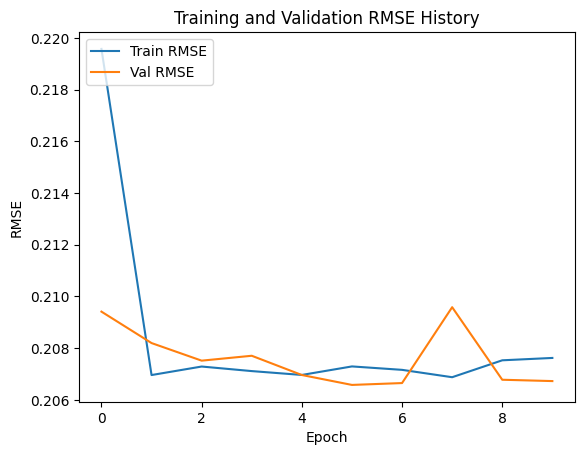

In [184]:
# Plot the training & validation RMSE

plt.rcdefaults() # reset to rc default values
plt.plot(resnet_lrs8_hist['root_mean_squared_error'])
plt.plot(resnet_lrs8_hist['val_root_mean_squared_error'])

plt.title("Training and Validation RMSE History")
plt.xlabel("Epoch")
plt.ylabel("RMSE")

plt.legend(["Train RMSE", "Val RMSE"], loc ="upper left")

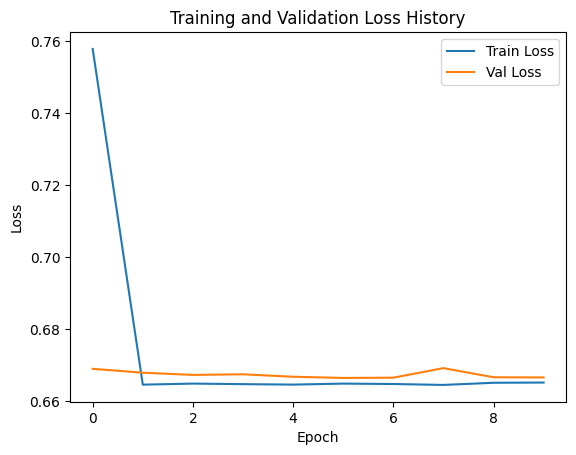

In [185]:
# Plot the training & validation loss

plt.plot(resnet_lrs8_hist['loss'])
plt.plot(resnet_lrs8_hist['val_loss'])

plt.title("Training and Validation Loss History")
plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.legend(["Train Loss", "Val Loss"], loc ="upper right")

### ResNet with Learning Rate Scheduler Evaluation - Model 8

In [178]:
# Pawpularity scores 
pawp_scores_lrs8 = resnet_lrs8.evaluate(test_dataset, verbose = 1) 
print('Test loss:', pawp_scores_lrs8[0]) 
print('Test RMSE:', pawp_scores_lrs8[1])

62/62 [==============================] - 21s 332ms/step - loss: 0.6635 - root_mean_squared_error: 0.2043
Test loss: 0.6635199189186096
Test RMSE: 0.20430901646614075


### ResNet with Learning Rate Scheduler Prediction - Model 8

In [186]:
# Predictions on Testing data
resnet_lrs8.predict(test_dataset)

62/62 [==============================] - 10s 158ms/step


array([[0.37360317],
       [0.37360317],
       [0.37360317],
       ...,
       [0.37360317],
       [0.37360317],
       [0.37360317]], dtype=float32)

### Model 9

In [179]:
# Define ResNet with learning rate scheduler

def build_resnet_LRS9():
    tf.keras.backend.clear_session()
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Conv2D(64, kernel_size=7, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False, input_shape=[224,224,3]))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Activation('relu'))
    model.add(tf.keras.layers.MaxPooling2D(pool_size=3, strides=2, padding='same'))
    prev_filters = 128
    for filters in [64, 64, 128, 256, 512]:
        strides = 1 if filters == prev_filters else 2
        model.add(ResidualUnit(filters, strides=strides))
        prev_filters = filters


    model.add(tf.keras.layers.GlobalAvgPool2D())
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dropout(0.25))
    model.add(tf.keras.layers.Dense(units=1, activation="sigmoid"))

    # Learning rate scheduler
    initial_learning_rate = 0.1
    lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay( initial_learning_rate, decay_steps=100000, decay_rate=0.96, staircase=True)

    optimizer_lrs = tf.keras.optimizers.legacy.SGD(learning_rate=lr_schedule)
    
    model.compile(optimizer=optimizer_lrs,
                  loss="binary_crossentropy",
                  metrics=[tf.keras.metrics.RootMeanSquaredError()])
    return model

In [180]:
# build model
resnet_lrs9 = build_resnet_LRS9()

# use early stopping
early_stopping_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, verbose=1, restore_best_weights=True)

# Train the model
history_rn_lrs9 = resnet_lrs9.fit(train_dataset,
                                epochs=10,
                                validation_data=val_dataset,
                                verbose=1,
                                callbacks=[early_stopping_callback])

Epoch 1/10
198/198 [==============================] - 368s 2s/step - loss: 0.7856 - root_mean_squared_error: 0.2736 - val_loss: 0.7270 - val_root_mean_squared_error: 0.2375
Epoch 2/10
198/198 [==============================] - 361s 2s/step - loss: 0.6727 - root_mean_squared_error: 0.2150 - val_loss: 0.6857 - val_root_mean_squared_error: 0.2284
Epoch 3/10
198/198 [==============================] - 357s 2s/step - loss: 0.6704 - root_mean_squared_error: 0.2130 - val_loss: 0.6729 - val_root_mean_squared_error: 0.2141
Epoch 4/10
198/198 [==============================] - 324s 2s/step - loss: 0.6673 - root_mean_squared_error: 0.2097 - val_loss: 0.6799 - val_root_mean_squared_error: 0.2219
Epoch 5/10
198/198 [==============================] - 326s 2s/step - loss: 0.6652 - root_mean_squared_error: 0.2074 - val_loss: 0.6736 - val_root_mean_squared_error: 0.2125
Epoch 6/10
198/198 [==============================] - 328s 2s/step - loss: 0.6593 - root_mean_squared_error: 0.2005 - val_loss: 0.6731 

### ResNet with Learning Rate Scheduler Evaluation - Model 9

In [181]:
# Pawpularity scores 
pawp_scores_lrs9 = resnet_lrs9.evaluate(test_dataset, verbose = 1) 
print('Test loss:', pawp_scores_lrs9[0]) 
print('Test RMSE:', pawp_scores_lrs9[1])

62/62 [==============================] - 10s 167ms/step - loss: 0.6703 - root_mean_squared_error: 0.2123
Test loss: 0.6703352928161621
Test RMSE: 0.21230542659759521


### Step 6: Interpretation

TBD